## Loading Well Log Data Using Welly

In [1]:
from welly import Well
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy


# Used for offline plotting
from plotly.offline import init_notebook_mode, iplot

# Graphs
import plotly.graph_objs as go

from dashwellviz.figures import cross_over_log, add_multiaxis_to_subplot_fig

init_notebook_mode()


In [2]:
w = Well.from_las('../Data/Poseidon1Decim.LAS')

/home/wesley/.conda/envs/python3/lib/python3.8/site-packages/welly/well.py:173: FutureWarning:

From v0.5 the default will be 'original', keeping whatever is used in the LAS file. If you want to force conversion to metres, change your code to use `index='m'`.



In [3]:
w

Well(uwi: '', 9 curves: ['ECGR', 'ATRX', 'ATRT', 'NPHI', 'CAL1', 'HDAR', 'HROM', 'DTSM', 'DTCO'])

### Make simple plot of data contained in .las file

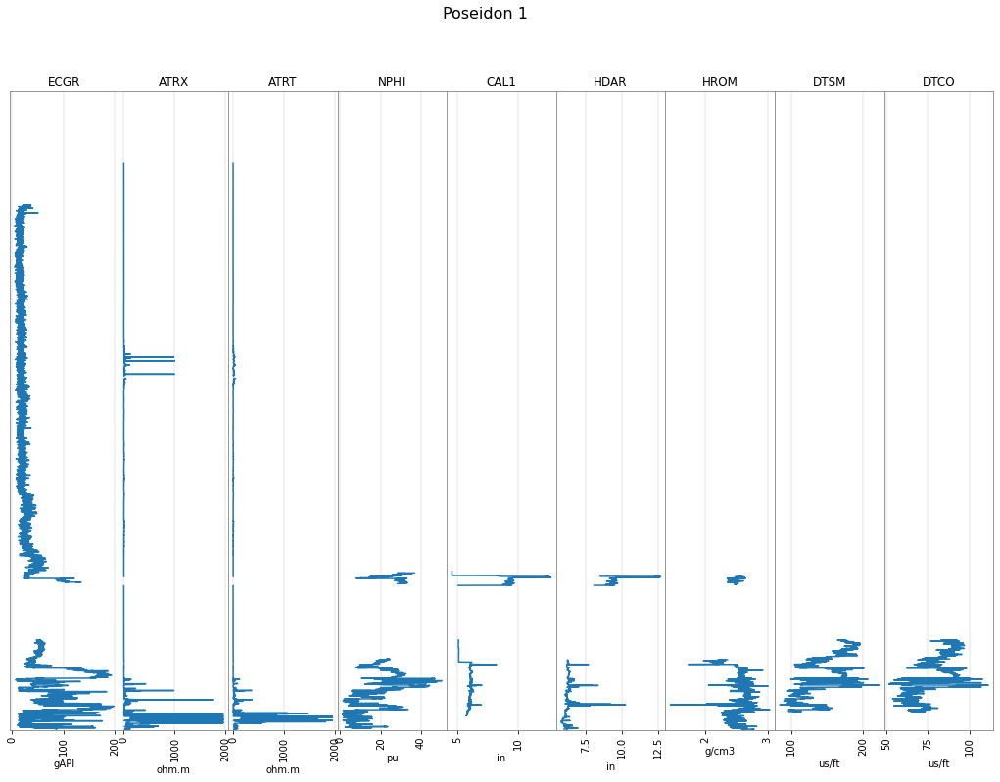

In [4]:
w.plot()

### Convert welly file to DataFrame

In [5]:
df = w.df()

In [6]:
df.describe()

,ECGR,ATRX,ATRT,NPHI,CAL1,HDAR,HROM,DTSM,DTCO
count,7487.000000,8855.000000,8854.000000,1290.000000,1444.000000,1259.000000,1252.000000,1156.000000,1129.000000
mean,31.624173,26.453919,15.463590,18.541919,6.162874,6.695136,2.534278,144.813188,78.786831
std,31.016042,180.094674,107.187367,11.081651,1.374944,1.233465,0.160123,31.304852,12.387644
min,5.032100,0.110000,0.180300,1.040000,4.541200,5.805600,1.442300,83.223400,51.441600
25%,16.023500,0.742050,0.770000,8.047500,5.127500,6.167600,2.452950,114.322325,67.380200
50%,20.684400,1.538900,1.499650,18.895000,6.060150,6.284100,2.556650,141.621100,78.524500
75%,31.565950,3.522000,3.600750,27.247500,6.131525,6.395200,2.643000,174.653375,90.410100
max,198.636100,1950.000000,1950.000000,50.190000,12.766300,12.686800,3.035800,221.921700,111.538200


In [7]:
# Generate Vp and Vs from DTco and DTsm
df['Vp'] = (1000000 / df['DTCO']) / 3.281
df['Vs'] = (1000000 / df['DTSM']) / 3.281
df['Vp_max'] = df['Vp'].max() + 200

In [8]:
df['Depth'] = df.index

In [9]:
df.describe()

,ECGR,ATRX,ATRT,NPHI,CAL1,HDAR,HROM,DTSM,DTCO,Vp,Vs,Vp_max,Depth
count,7487.000000,8855.000000,8854.000000,1290.000000,1444.000000,1259.000000,1252.000000,1156.000000,1129.000000,1129.000000,1156.000000,9.073000e+03,9073.000000
mean,31.624173,26.453919,15.463590,18.541919,6.162874,6.695136,2.534278,144.813188,78.786831,3969.812570,2209.899179,6.124876e+03,2847.500000
std,31.016042,180.094674,107.187367,11.081651,1.374944,1.233465,0.160123,31.304852,12.387644,651.549083,494.454842,1.819090e-12,1309.646915
min,5.032100,0.110000,0.180300,1.040000,4.541200,5.805600,1.442300,83.223400,51.441600,2732.562714,1373.390374,6.124876e+03,579.500000
25%,16.023500,0.742050,0.770000,8.047500,5.127500,6.167600,2.452950,114.322325,67.380200,3371.140243,1745.085854,6.124876e+03,1713.500000
50%,20.684400,1.538900,1.499650,18.895000,6.060150,6.284100,2.556650,141.621100,78.524500,3881.401683,2152.116662,6.124876e+03,2847.500000
75%,31.565950,3.522000,3.600750,27.247500,6.131525,6.395200,2.643000,174.653375,90.410100,4523.363339,2666.015902,6.124876e+03,3981.500000
max,198.636100,1950.000000,1950.000000,50.190000,12.766300,12.686800,3.035800,221.921700,111.538200,5924.876491,3662.252762,6.124876e+03,5115.500000


In [10]:
df.head()

,ECGR,ATRX,ATRT,NPHI,CAL1,HDAR,HROM,DTSM,DTCO,Vp,Vs,Vp_max,Depth
Depth,,,,,,,,,,,,,
579.5,NaN,0.6000,0.6700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6124.876491,579.5
580.0,NaN,0.6700,0.7000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6124.876491,580.0
580.5,NaN,0.6200,0.6700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6124.876491,580.5
581.0,NaN,0.5500,0.6400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6124.876491,581.0
581.5,NaN,0.5598,0.6295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6124.876491,581.5


In [11]:
dtco = w.data['DTCO']
dtsm = w.data['DTSM']

In [12]:
dtco = dtco.to_basis(start=4400, stop=5000)
dtsm = dtco.to_basis(start=4400, stop=5000)

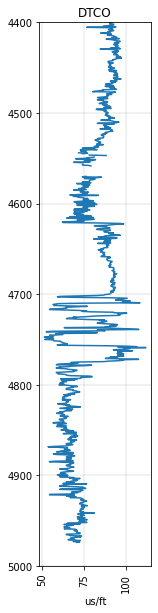

In [13]:
dtco.plot()

### Making some scatter plots in Plotly

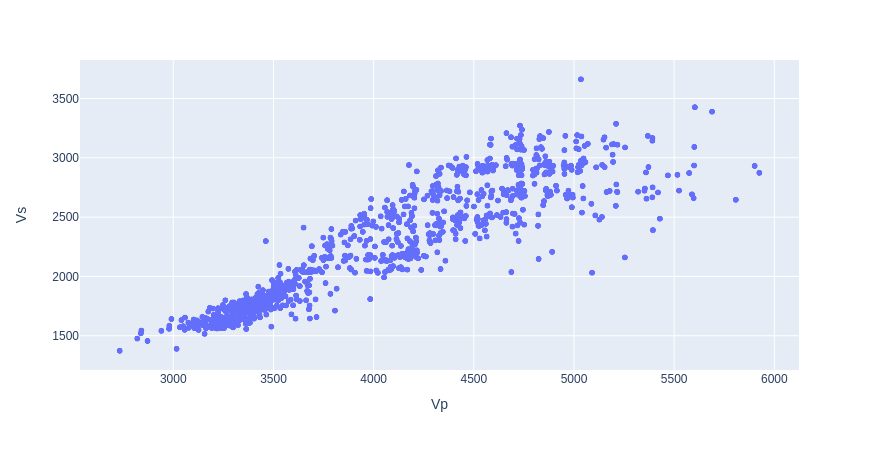

In [14]:
fig = px.scatter(df, x="Vp", y="Vs")
fig.show()

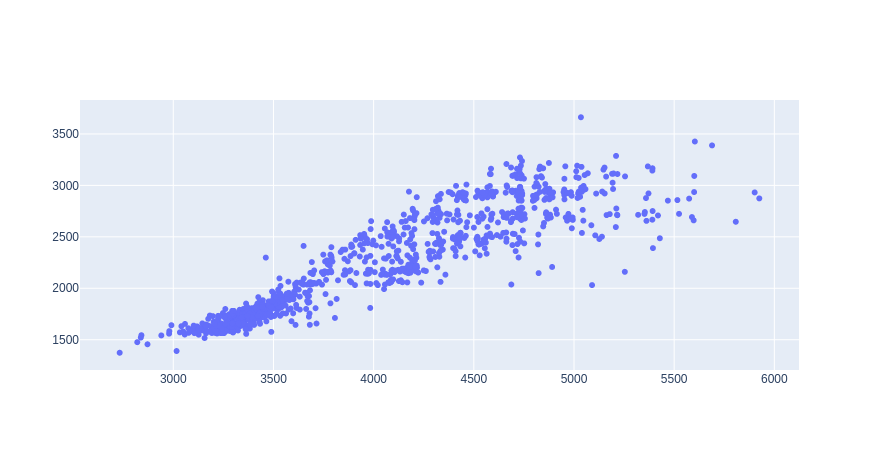

In [15]:
fig = go.Figure(data=go.Scatter(x=df["Vp"], y=df["Vs"], mode='markers'))

fig.show()

## Production ready cross plot

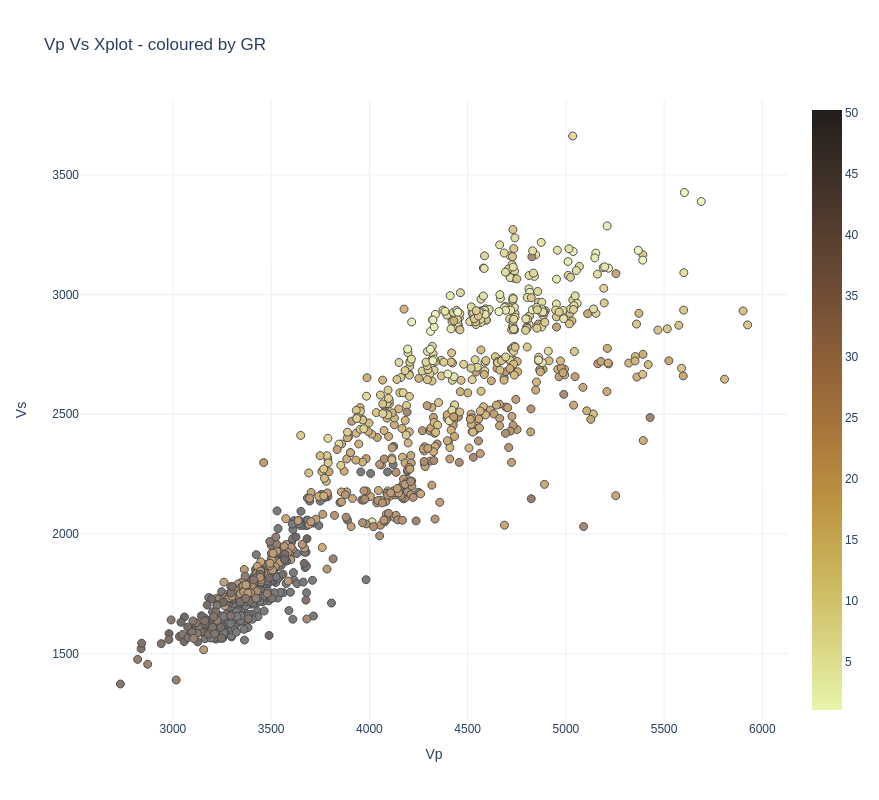

In [16]:
fig = go.Figure(data=go.Scatter(
    x = df['Vp'],
    y = df['Vs'],
    mode='markers',
    opacity=0.7,
    marker=dict(
        size=8,
        color=df['NPHI'], #set color equal to a variable
        colorscale='turbid', # one of plotly colorscales
        line=dict(
            color='black',
            width=1
        ),
        showscale=True
    )
))

fig.update_xaxes(title_text='Vp')
fig.update_yaxes(title_text='Vs')
fig.update_layout(template='plotly_white', height=800, width=800, title_text="Vp Vs Xplot - coloured by GR")

fig.show()

### Making some Well Plots in Plotly

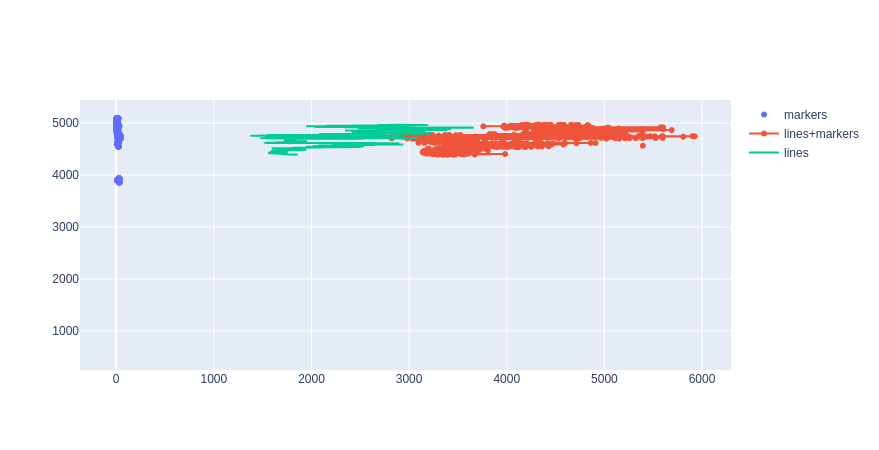

In [17]:
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['NPHI'], y=df['Depth'],
                    mode='markers',
                    name='markers'))
fig.add_trace(go.Scatter(x=df['Vp'], y=df['Depth'],
                    mode='lines+markers',
                    name='lines+markers'))
fig.add_trace(go.Scatter(x=df['Vs'], y=df['Depth'],
                    mode='lines',
                    name='lines'))


fig.show()

## Production ready multi log plot 

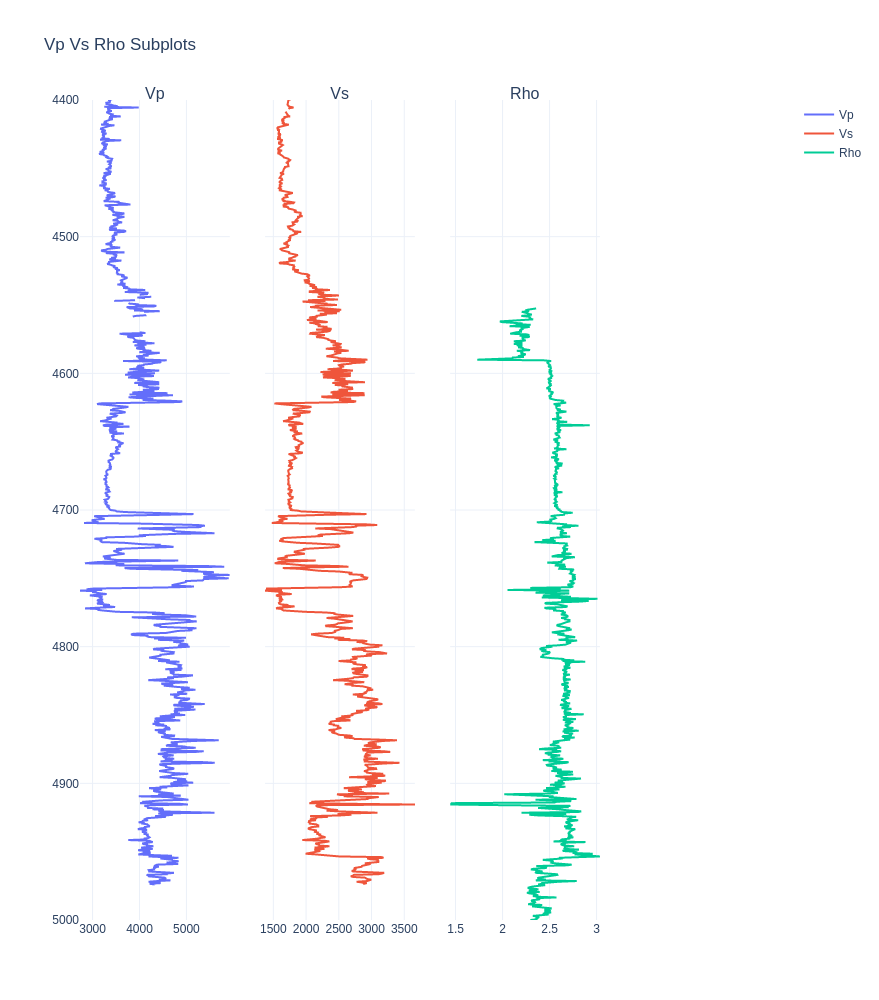

In [18]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=4, subplot_titles=("Vp","Vs", "Rho"), shared_yaxes=True)

fig.add_trace(
    go.Scatter(x=df['Vp'], y=df.index, name='Vp'),
    row=1, col=1,
)

fig.add_trace(
    go.Scatter(x=df['Vs'], y=df.index, name='Vs'),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=df['HROM'], y=df.index, name='Rho'), 
    row=1, col=3
)

fig.update_yaxes(range=[5000, 4400])
fig.update_layout(template='plotly_white', height=1000, width=600, title_text="Vp Vs Rho Subplots")
fig.show()

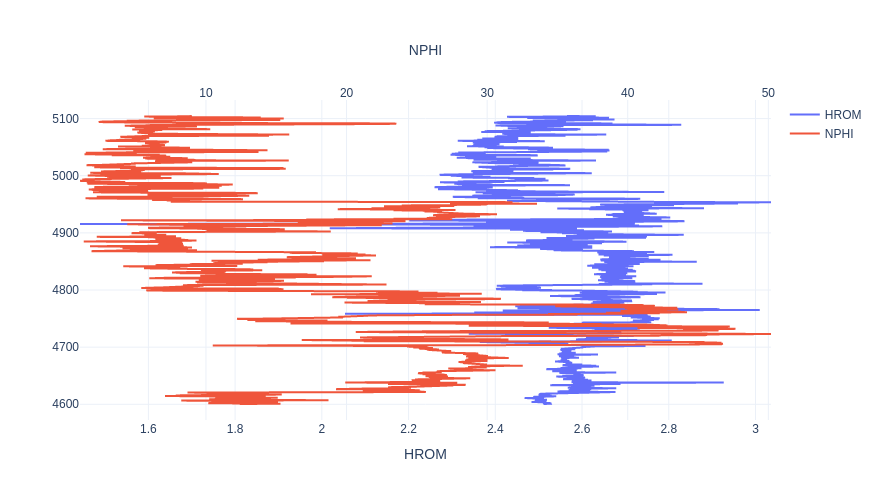

In [19]:
fig_cross_over = cross_over_log(df[df.index > 4600], "HROM", "NPHI", normalized=False)
fig_cross_over.update_layout(height=500)

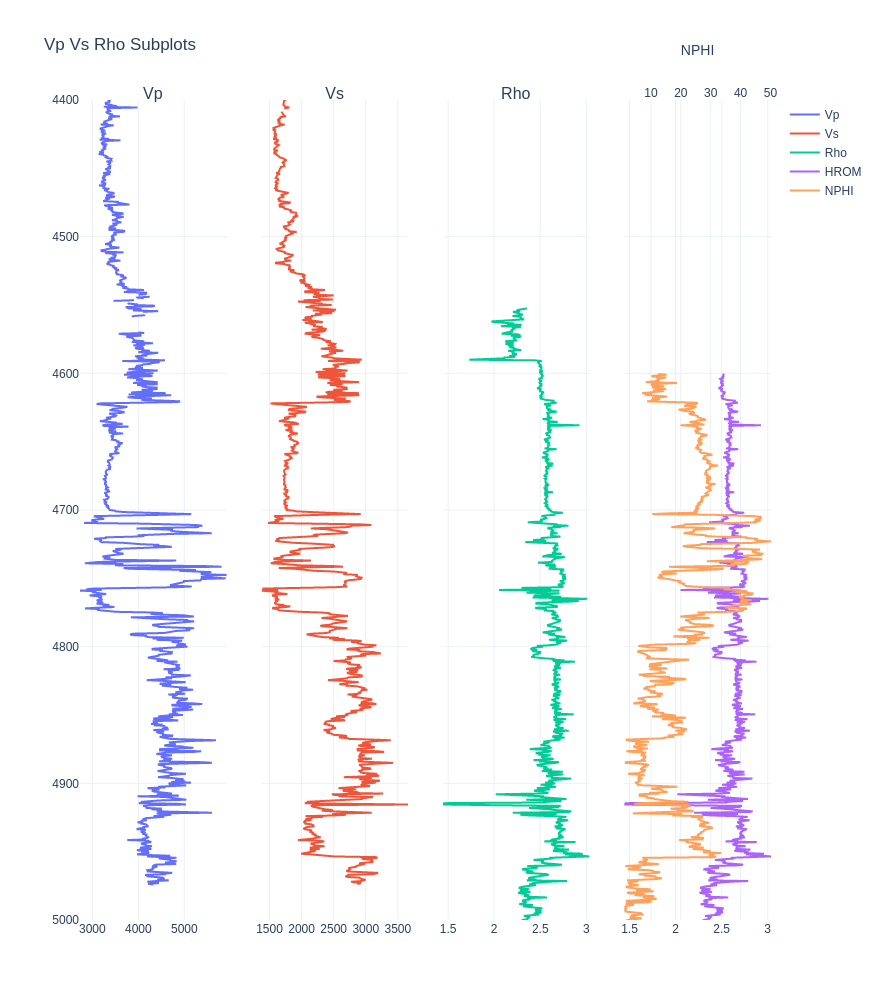

In [20]:
add_multiaxis_to_subplot_fig(fig, fig_cross_over, 1, 4)

## Production ready single colour fill plot

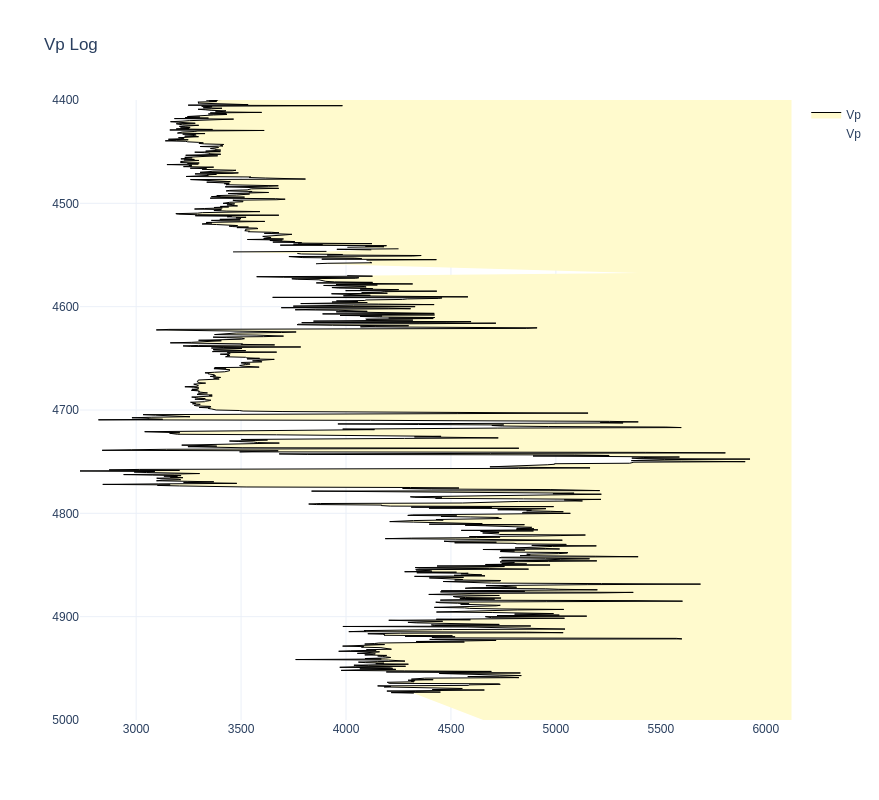

In [21]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df['Vp_max'], y=df.index, name='Vp',
                         line=dict(color='white', width=1)))

fig.add_trace(go.Scatter(x=df['Vp'], y=df.index, fill='tonextx', fillcolor='lemonchiffon', name='Vp',
                         line=dict(color='black', width=1)))

fig.update_yaxes(range=[5000, 4400])
fig.update_layout(template='plotly_white', height=800, width=250, title_text="Vp Log")
fig.show()

## Everything else under here still Work in Progress

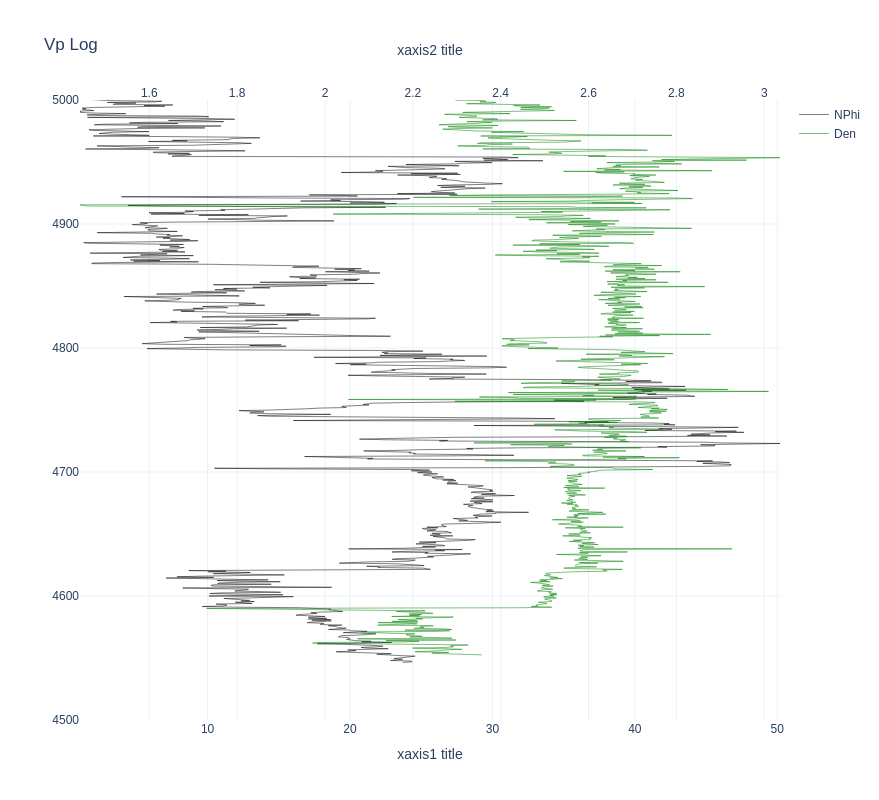

In [22]:
# NPHI plot
nphi = go.Scatter(
    x=df['NPHI'],
    y=df.index,
    name='NPhi',
#     fill='tonextx',
    line=dict(color='black', width=0.5),
)

# HROM plot
hrom = go.Scatter(
    x=df['HROM'],
    y=df.index,
    xaxis='x2',
    name='Den',
    line=dict(color='green', width=0.5),
)

data = [nphi, hrom]
# data = [nphi]
layout = go.Layout(
   title = 'Den Por Plot',
    xaxis=dict(
        title="xaxis1 title",
    ),
    xaxis2=dict(
        title="xaxis2 title",
        anchor="y",
        overlaying="x",
        side="top"
    ),
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(template='plotly_white', height=800, width=350, title_text="Vp Log")
fig.update_yaxes(range=[4500, 5000])
iplot(fig)

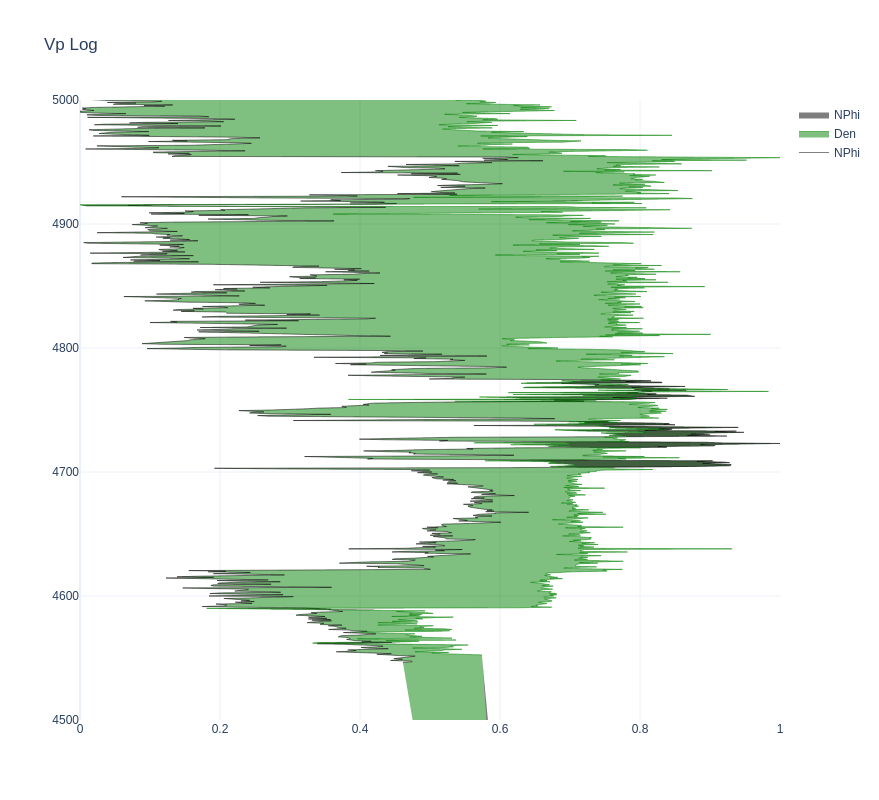

In [23]:

# NPHI plot
nphi = go.Scatter(
    x=(df['NPHI'] - df['NPHI'].min())/(df['NPHI'].max() - df['NPHI'].min()),
    y=df.index,
    name='NPhi',
#     fill='tonextx',
    line=dict(color='black', width=0.5),
)

# HROM plot
hrom = go.Scatter(
    x=(df['HROM'] - df['HROM'].min())/(df['HROM'].max() - df['HROM'].min()),
    y=df.index,
#     xaxis='x2',
    name='Den',
    fill='tonexty',
    line=dict(color='green', width=0.5),
)

# NPHI plot
nphi1 = go.Scatter(
    x=numpy.max(((df['HROM'] - df['HROM'].min())/(df['HROM'].max() - df['HROM'].min()), (df['NPHI'] - df['NPHI'].min())/(df['NPHI'].max() - df['NPHI'].min())), axis=0),
    y=df.index,
    name='NPhi',
    fill='tonextx',
    line=dict(color='black', width=0),
)

# fig.add_trace(go.Scatter(x=df['HROM'], y=df.index, 
#                          fill='tonextx', fillcolor='lemonchiffon', 
#                          name='Vp', xaxis='x2',
#                          line=dict(color='black', width=1)))

data = [nphi, hrom, nphi1]
# data = [nphi]
layout = go.Layout(
   title = 'Den Por Plot',
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(template='plotly_white', height=800, width=350, title_text="Vp Log")
fig.update_yaxes(range=[4500, 5000])
iplot(fig)

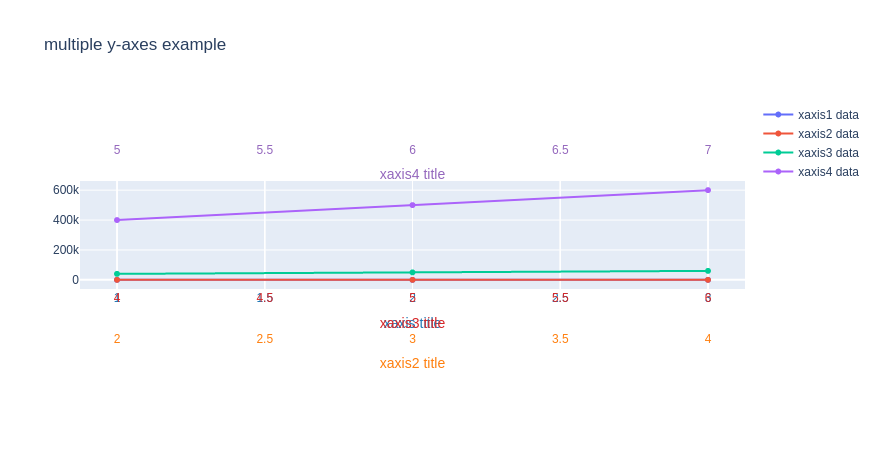

In [24]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=[1, 2, 3],
    y=[4, 5, 6],
    name="xaxis1 data"
))


fig.add_trace(go.Scatter(
    x=[2, 3, 4],
    y=[40, 50, 60],
    name="xaxis2 data",
    xaxis="x2"
))

fig.add_trace(go.Scatter(
    x=[4, 5, 6],
    y=[40000, 50000, 60000],
    name="xaxis3 data",
    xaxis="x3"
))

fig.add_trace(go.Scatter(
    x=[5, 6, 7],
    y=[400000, 500000, 600000],
    name="xaxis4 data",
    xaxis="x4"
))


# Create axis objects
fig.update_layout(
    yaxis=dict(
        domain=[0.3, 0.7]
    ),
    xaxis=dict(
        title="xaxis title",
        titlefont=dict(
            color="#1f77b4"
        ),
        tickfont=dict(
            color="#1f77b4"
        )
    ),
    xaxis2=dict(
        title="xaxis2 title",
        titlefont=dict(
            color="#ff7f0e"
        ),
        tickfont=dict(
            color="#ff7f0e"
        ),
        anchor="free",
        overlaying="x",
        side="left",
        position=0.15
    ),
    xaxis3=dict(
        title="xaxis3 title",
        titlefont=dict(
            color="#d62728"
        ),
        tickfont=dict(
            color="#d62728"
        ),
        anchor="y",
        overlaying="x",
        side="right"
    ),
    xaxis4=dict(
        title="xaxis4 title",
        titlefont=dict(
            color="#9467bd"
        ),
        tickfont=dict(
            color="#9467bd"
        ),
        anchor="free",
        overlaying="x",
        side="right",
        position=0.85
    )
)

# Update layout properties
fig.update_layout(
    title_text="multiple y-axes example",
    width=800,
)

fig.show()

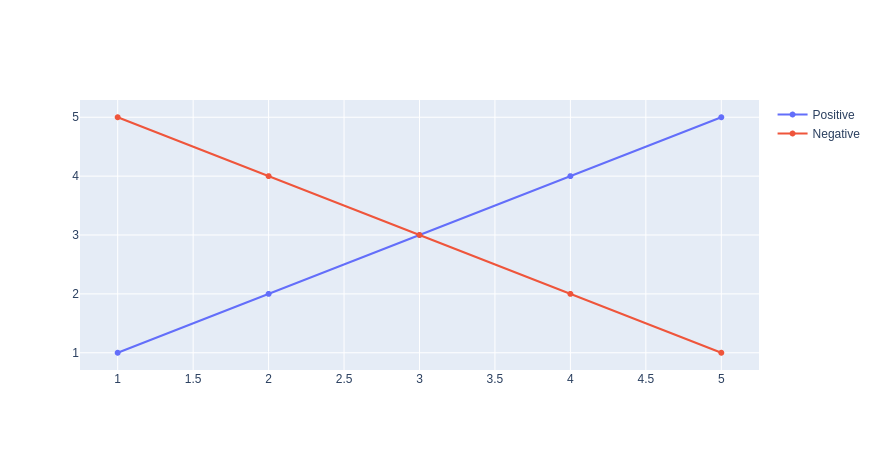

In [25]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=[1, 2, 3, 4, 5],
    y=[1, 2, 3, 4, 5],
    name="Positive"
))

fig.add_trace(go.Scatter(
    x=[1, 2, 3, 4, 5],
    y=[5, 4, 3, 2, 1],
    name="Negative"
))

fig.show()